## DFT Audio Signal Analysis

You will be using the fast Fourier transform (FFT) to analyze two audio signals. These are a clip of a person speaking (``winniethepooh.wav`` : Chapter 5 of A. A. Milne's classic, *Winnie the Pooh*, read by Phil Chenevert, audio from LibriVox: https://librivox.org/winnie-the-pooh-by-a-a-milne/) and a clip of piano music (``bach.wav`` : J. S. Bach's *Two Part Invention Number 13 in A Minor*). Download these files from the class webpage.


## Question 1:

The frequency band for voice used in telephones is approximately 300 to 3400 Hz. (https://en.wikipedia.org/wiki/Voice_frequency). To simulate this, take the FFT of the voice audio signal and apply a bandpass filter in the voice frequency range. That is, set the $Y[k] = w[k] X[k]$, where $w[k]$ is set to one for frequencies in the 300--3400 Hz range and set to zero elsewhere. **Note:** you will need to first calculate the conversion of the frequency parameter $k$ into Hz. Take the inverse FFT and listen to the resulting audio.

## Answer:

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import wave
from IPython.display import Audio

def kTofreq(k, framerate, length):
    frequency = (k*framerate)/length
    return frequency

#open audio file and convert to audio signal array
voice_audio_file = wave.open("winniethepooh.wav")
nframes = voice_audio_file.getnframes()
voice_audio_signal = np.frombuffer(voice_audio_file.readframes(nframes), dtype = np.int16)

#establish audio signal and get sampling rate 
voice_audio_signal = voice_audio_signal.astype(float)
framerate = voice_audio_file.getframerate()

#print("Original Audio:")
#Audio(data = voice_audio_signal, rate = framerate)

#take fft
FFT_signal = np.fft.rfft(voice_audio_signal)
N = len(FFT_signal)

#iterate through FFT_signal and zero all index k where conversion to hertz is outside the range 300<x<3400
for k in range(N):
    frequency = kTofreq(k, framerate, N)
    if frequency < 300 or frequency > 3400:
        FFT_signal[k] = 0

#inverse fft
FFT_inverse_signal = np.fft.irfft(FFT_signal)
print("Resulting Audio:")
Audio(data = FFT_inverse_signal, rate = framerate)
    


Resulting Audio:


## Question 2:

According to the same Wikipedia page, the fundamental frequency of a male speaking voice is between 85 to 155 Hz. Apply the same bandpass filter procedure as above, but with the frequency range of 85--310 Hz. (We have to double the upper limit of the frequency range to avoid aliasing. This is due to what is called the Nyquist-Shannon theorem, which we'll cover later in class!) Again, listen to the resulting audio. Is the speech still understandable when keeping only the fundamental frequencies, or were the harmonic overtones important contributions?

## Answer:

In [47]:
#iterate through FFT_signal and zero all index k where conversion to hertz is outside the range 85<x<310
for k in range(N):
    frequency = kTofreq(k, framerate, N)
    if frequency < 85 or frequency > 310:
        FFT_signal[k] = 0
        
#inverse fft
FFT_inverse_signal = np.fft.irfft(FFT_signal)
print("Resulting Audio:")
Audio(data = FFT_inverse_signal, rate = framerate)

Resulting Audio:


The speech is no longer understandable when maintaining only the fundamental frequencies, and it is likely because the removal of harmonic overtones exaggerate the muffled aspects of the audio and make it unintelligible. 

## Question 3:

Now compute an FFT of the piano music signal. Plot the magnitude of the FFT, $|X[k]|$, as a function of frequency in Hz. What are the 3 most prominent frequencies in Hz (a.k.a., what is the position on the frequency axis of the three highest peaks in the plot)? Refer to the following table of musical note frequencies:

https://en.wikipedia.org/wiki/Scientific_pitch_notation#Table_of_note_frequencies

What musical notes do these frequencies represent? Give the note letter and octave number, for example, 440 Hz is the note A4. **Hint: They may not be the notes you are expecting for a piece in the key of A minor!**

## Answer:

Top 3 Recurring Frequencies (Hz): [587.57138325 587.0161802  493.79758883 247.00983503 493.4089467 ]
D5, B4, B3


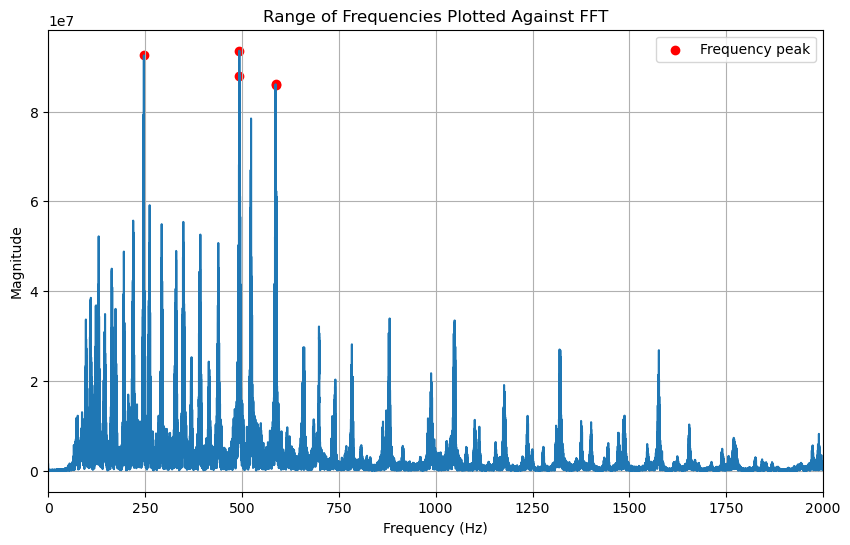

In [48]:
#open audio file and convert to audio signal array
piano_file = wave.open("bach.wav")
nframes = piano_file.getnframes()
piano_signal = np.frombuffer(piano_file.readframes(nframes), dtype = np.int16)

#establish audio signal and get sampling rate 
piano_signal = piano_signal.astype(float)
framerate = piano_file.getframerate()

#print("Original Audio:")
#Audio(data = voice_audio_signal, rate = framerate)

#take fft
FFT_signal = np.fft.rfft(piano_signal)
FFT_freqs = np.fft.rfftfreq(len(piano_signal), d=1/framerate)
#Audio(data = FFT_signal, rate = framerate)

# Find the frequencies corresponding to the maximum values in the FFT
maxIndex = np.argsort(np.abs(FFT_signal))[-5:]
maxFreq = fft_freqs[maxIndex]

# Print the maximum frequencies
print("Top 3 Recurring Frequencies (Hz):", maxFreq)
print("D5, B4, B3")

plt.figure(figsize=(10, 6)) 
plt.plot(FFT_freqs, np.abs(FFT_signal))
plt.title('Range of Frequencies Plotted Against FFT')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.scatter(maxFreq, np.abs(FFT_signal[maxIndex]), color='red', label='Frequency peak')
plt.legend()
plt.xlim(0, 2000)  # Assuming fft_freqs is sorted in ascending order

plt.show()


## DFT Exercises

## Question 4:

Consider the following periodic signal, with period $L$:

  $$x[n] = \frac{1}{2}(\delta[n - 1] - \delta[n - L + 1]), \quad \quad \text{for $0 \leq n \leq L - 1$}.$$

* **(a)** Using the definition of the DFT analysis equation, compute $X[k]$. Simplify your equation until it is clear that $X[k]$ is imaginary (in the form of $i$ times a real number). **Show your steps.**

* **(b)** Now compute the DFT $X[k]$ by starting with a DFT pair we discussed in class and applying properties of the DFT. Confirm that it is equal to the answer you got in part (a). **Again, show your steps.**

* **(c)** In Python, construct the signal $x[n]$ for $L = 10$. Compute the DFT using the ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to a plot of your equation in part (a).

## Answer:

## (a)

 $$x[k] = \frac{1}{\sqrt{L}}\sum_{n=0}^{L-1}(e^{-iw_0kn}x[n]) = \frac{1}{2\sqrt{L}}\sum_{n=0}^{L-1}(e^{-iw_0kn}(\delta[n-1]-\delta[n-L+1]))$$
 
 $$ = \frac{1}{2\sqrt{L}}(\sum_{n=0}^{L-1}(e^{-iw_0kn}\delta[n-1]-\sum_{n=0}^{L-1}(e^{-iw_0kn}\delta[n-L+1]) = \frac{1}{2\sqrt{L}}(e^{-iw_ok}-e^{-iw_ok[L-1]} )$$

$$ =\frac{1}{2\sqrt{L}}((\cos(w_ok)-i\sin(w_ok) - (\cos(w_ok[L+1]-i\sin(w_ok[L-1])) $$
$$ = \frac{1}{2\sqrt{L}}(-i\sin(w_ok) + i\sin(w_ok[L-1]) = i(\frac{-\sin(w_ok) + \sin(w_ok[L-1])}{2\sqrt{L}}) $$
## (b) 

Given DFT Pair: $x[n] = \delta{[n]} \longleftrightarrow x[k] = \frac{1}{\sqrt{L}}$

Apply Time Shift Property: $x[n-m] = \delta{[n-1] - \delta{[n-L+1]}} \longleftrightarrow \frac{1}{\sqrt{L}}\sum_{n=0}^{L-1}(e^{-iw_0kn}x[n-m]) $

Apply Linearity Property (Scalability and Additivity): $a[n-m] + by[n-m]\} = \frac{1}{2}\delta{[n-1]} - \frac{1}{2} \delta{[n-L+1]} \longleftrightarrow aX[k] + bY[k] = \frac{1}{2\sqrt{L}}(\sum_{n=0}^{L-1}(e^{-iw_0kn}\delta[n-1]-\sum_{n=0}^{L-1}(e^{-iw_0kn}\delta[n-L+1])$

## (c)

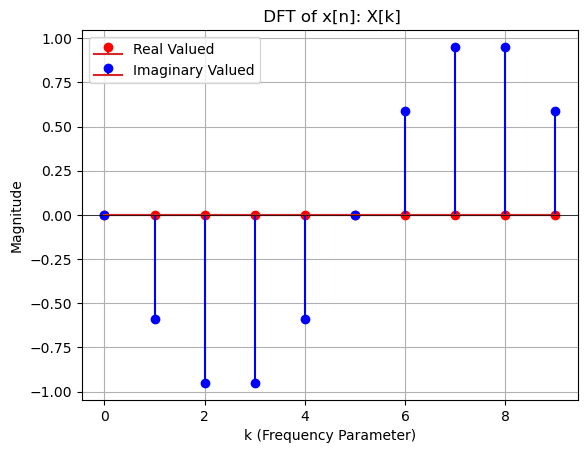

In [49]:
impulseFunction1 = np.zeros(10)
impulseFunction2 = np.zeros(10)

impulseFunction1[1] = 1
impulseFunction2[10-1] = 1
signalX = 0.5 * (impulseFunction1 - impulseFunction2)
signalX = np.fft.fft(signalX)
L = len(signalX)

plt.stem(np.arange(L), np.real(signalX), linefmt='r-', label='Real Valued')
plt.stem(np.arange(L), np.imag(signalX), linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()

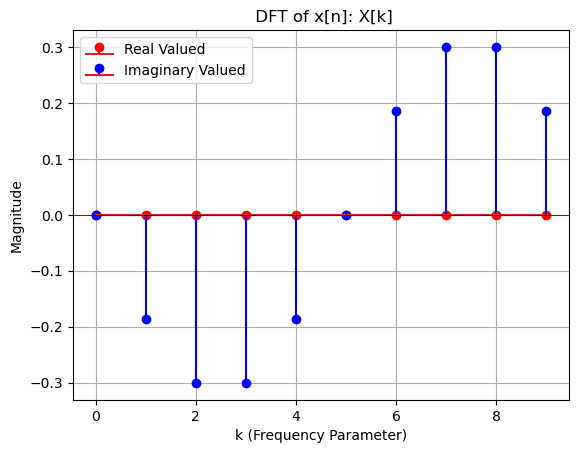

In [50]:
xReal = np.zeros(10)
xImaginary = np.zeros(10)
for k in np.arange(10):
    signalX = (1j)*(-1*np.sin(2*np.pi/10*k) + np.sin(2*np.pi/10*k*9))/(2*np.sqrt(L))
    xReal[k] = np.real(signalX)
    xImaginary[k] = np.imag(signalX)
    
L = len(xReal)
plt.stem(np.arange(L), xReal, linefmt='r-', label='Real Valued')
plt.stem(np.arange(L), xImaginary, linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()

## Question 5:

Consider the following periodic signal, with period $L$ being an **even number**:

  $$x[n] = \begin{cases} 1 & \text{for $n$ even,}\\ -1 & \text{for $n$ odd.}\end{cases}$$

* **(a)** Write an equation for $X[k] = \mathcal{DFT}\{x[n]\}$. Simplify your equation until it is clear that $X[k]$ is real-valued. **Show your steps.**

* **(b)** In Python, construct the signal for $L = 10$. Compute the DFT using ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to the plot of your equation in part (a).

## Answer:

## (a)   
$$x[n] = \cos(\pi n)$$
$$x[n] = \cos(w_omn) = \cos(\frac{2\pi}{L}mn) =\cos(\frac{2\pi}{L}(\frac{L}{2})n) = \cos(\pi n)$$
$$x[k] = \frac{\sqrt{L}}{2}(\delta[k - m] + \delta[k - L + m])$$
$$x[k] = \frac{\sqrt{L}}{2}(\delta[k - \frac{L}{2}] + \delta[k - L + \frac{L}{2}])$$
$$x[k] = \frac{\sqrt{L}}{2}(2\delta[k - \frac{L}{2}])$$
$$x[k] = \sqrt{L}(\delta[k - \frac{L}{2}])$$




## (b) 

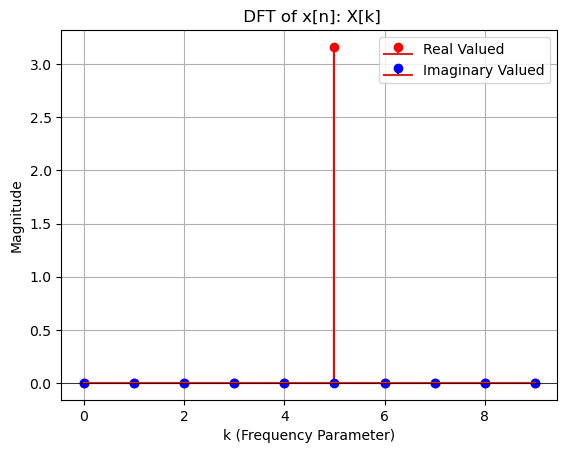

In [51]:
signalX = np.zeros(10)
L = len(signalX)
signalX[5] = np.sqrt(L)

plt.stem(np.arange(L), np.real(signalX), linefmt='r-', label='Real Valued')
plt.stem(np.arange(L), np.imag(signalX), linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()

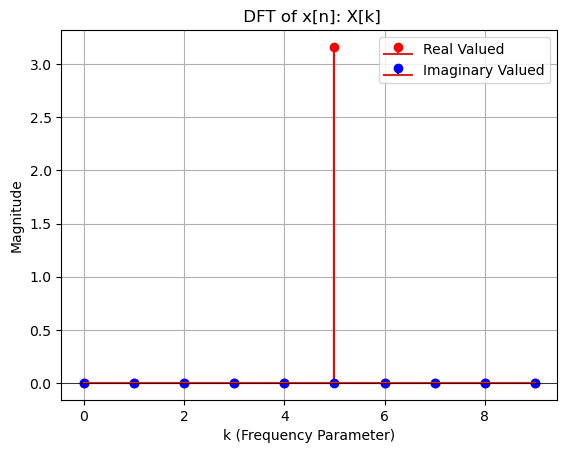

In [52]:
signalX = np.zeros(10)
for k in np.arange(10):
    signalX[k] = np.cos(np.pi * k)
signalX = np.fft.fft(signalX, norm="ortho")

L = np.arange(10)
plt.stem(L, np.real(signalX), linefmt='r-', label='Real Valued')
plt.stem(L, np.imag(signalX), linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()

# For Grads Only (or Extra Credit for Undergrads)

# Question 6:

Consider the following periodic signal, with period $L$ being an **even number**:

$$x[n] = \begin{cases} \cos\left(\frac{2\pi n}{L}\right) & \text{for $n$ even,}\\ -\cos\left(\frac{2\pi n}{L}\right) & \text{for $n$ odd.} \end{cases}$$

* **(a)** Write an equation for $X[k] = \mathcal{DFT}\{x[n]\}$. Simplify your equation until it is clear that $X[k]$ is real-valued. {\bf Show your steps.}

* **(b)** In Python, construct the signal $x[n]$ for $L = 40$. Compute the DFT using the ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to a plot of your equation in part (a).

## Answer:

## (a) 
$$x[n] = \pm \cos(\frac{2\pi n}{L})$$
Phase Shift by Pi
$$x[n] = \cos(w_omn) = \cos(\frac{2\pi}{L}mn) =\cos(\frac{2\pi}{L}(1+\frac{L}{2})n) $$
$$x[k] = \frac{\sqrt{L}}{2}(\delta[k - m] + \delta[k - L + m])$$
$$x[k] = \frac{\sqrt{L}}{2}(\delta[k - (1+\frac{L}{2})] + \delta[k - L + (1+\frac{L}{2})])$$
$$x[k] = \frac{\sqrt{L}}{2}(\delta[k -\frac{L+2}{2})] + \delta[k +\frac{2-L}{2})])$$


## (b) 

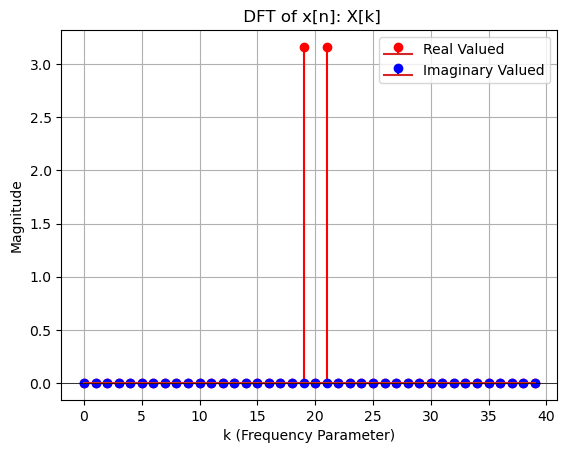

In [53]:
signalX = np.zeros(40)
for k in np.arange(40):
    signalX[k] = np.cos(k*2*np.pi / 40 + np.pi *k)
signalX = np.fft.fft(signalX, norm="ortho")

L = np.arange(40)
plt.stem(L, np.real(signalX), linefmt='r-', label='Real Valued')
plt.stem(L, np.imag(signalX), linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()

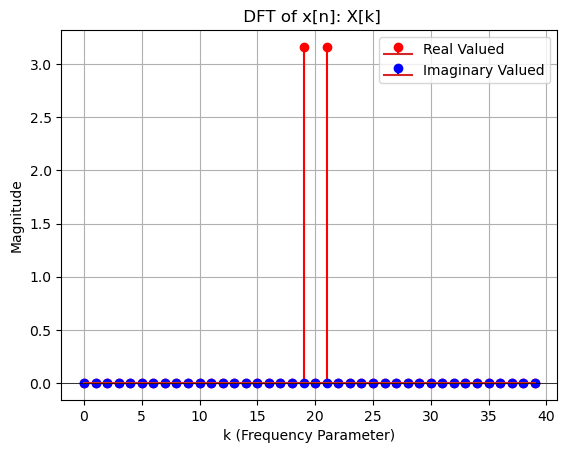

In [54]:
signalX = np.zeros(40)
L = len(signalX)
ind = (L+2)/2
signalX[int(ind)] = np.sqrt(L)/2
ind  = (L-2)/2
signalX[int(ind)] = np.sqrt(L)/2

plt.stem(np.arange(L), np.real(signalX), linefmt='r-', label='Real Valued')
plt.stem(np.arange(L), np.imag(signalX), linefmt='b-', label='Imaginary Valued')
plt.xlabel('k (Frequency Parameter)')
plt.ylabel('Magnitude')
plt.title(' DFT of x[n]: X[k]')
plt.axhline(0, color='black', linewidth=0.5)
plt.legend()
plt.grid(True)
plt.show()